<a href="https://colab.research.google.com/github/EiffL/LPTLensingComparison/blob/main/notebooks/InferencePorqueres2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Installing package
!pip install --quiet git+https://github.com/Eiffl/LPTLensingComparison.git
!pip install sbi

In [ ]:
import os

os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION']='.95'

In [ ]:
%pylab inline

import jax
import jax.numpy as jnp
import jax_cosmo as jc

Populating the interactive namespace from numpy and matplotlib


In [ ]:
# Build Porqueres et al. (2023) simulation setting
# https://arxiv.org/abs/2304.04785

from scipy.stats import norm

z = linspace(0, 2.5, 1000)

nz_shear = [jc.redshift.kde_nz(z,
                               norm.pdf(z, loc=z_center, scale=0.12) ,
                               bw=0.01, zmax=2.5, gals_per_arcmin2=g )
                for z_center, g in zip([0.5, 1., 1.5, 2.], [7,8.5, 7.5, 7])]
nbins = len(nz_shear)

# Define the fiducial cosmology
Omega_b = 0.049
Omega_c = 0.315 - Omega_b
sigma_8 = 0.8
h = 0.677
n_s = 0.9624
w0 = -1
cosmo = jc.Cosmology(Omega_c=Omega_c, sigma8=sigma_8, Omega_b=Omega_b,
                      h=h, n_s=n_s, w0=w0, Omega_k=0., wa=0.)

# Specify the size and resolution of the patch to simulate
field_size = 16.   # transverse size in degrees
field_npix = 64    # number of pixels per side
sigma_e = 0.3
print("Pixel size in arcmin: ", field_size * 60 / field_npix)

Pixel size in arcmin:  15.0


Text(0.5, 1.0, 'Redshift distribution')

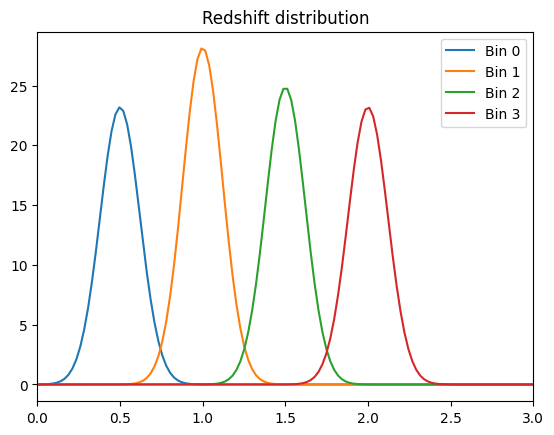

In [ ]:
# Plotting the redshift distribution
z = linspace(0, 3., 128)

for i in range(nbins):
  plot(z, nz_shear[i](z)*nz_shear[i].gals_per_arcmin2, color='C%d'%i, label="Bin %d"%i)
legend()
xlim(0,3)
title('Redshift distribution')

In [ ]:
# Now, let's build a full field model
import numpyro
import numpyro.distributions as dist
from numpyro.handlers import condition, seed, trace

from jax_lensing.model import make_full_field_model

box_size  = [1000., 1000., 4500.]     # In Mpc/h
box_shape = [64,  64,  128]           # Number of voxels/particles per side

# Generate the forward model given these survey settings
lensing_model = jax.jit(make_full_field_model( field_size=field_size,
                                            field_npix=field_npix,
                                            box_size=box_size,
                                            box_shape=box_shape))
# Define the probabilistic model
def model():
  """
  This function defines the top-level forward model for our observations
  """
  # Sampling initial conditions
  initial_conditions = numpyro.sample('initial_conditions', dist.Normal(jnp.zeros(box_shape),
                                                                        jnp.ones(box_shape)))

  Omega_c = numpyro.sample("Omega_c", dist.Uniform(0.1, 0.7))
  Omega_b = 0.049
  sigma8 = numpyro.sample("sigma8", dist.Uniform(0.5, 1.6))
  h = 0.677
  n_s = 0.9624
  w0 = -1
  cosmo = jc.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, sigma8=sigma8,
                       h=h, n_s=n_s, w0=w0, wa=0., Omega_k=0.)

  # Generate random convergence maps
  convergence_maps, _ = lensing_model(cosmo, nz_shear, initial_conditions)

  # Apply noise to the maps (this defines the likelihood)
  observed_maps = [numpyro.sample('kappa_%d'%i,
                                  dist.Normal(k, sigma_e/jnp.sqrt(nz_shear[i].gals_per_arcmin2*(field_size*60/field_npix)**2)))
                   for i,k in enumerate(convergence_maps)]

  return observed_maps

Once the model is defined, it needs to be seeded, and then can be ran and traced if one wants to access all the stochastic variables.

In [ ]:
# condition the model on a given set of parameters
fiducial_model = condition(model, {'Omega_c': cosmo.Omega_c,
                                  'sigma8': cosmo.sigma8})

# sample a mass map and save corresponding true parameters
model_trace = trace(seed(fiducial_model, jax.random.PRNGKey(1234))).get_trace()

/usr/local/lib/python3.10/dist-packages/jax/_src/numpy/array_methods.py:66: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in astype is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  return lax_numpy.astype(arr, dtype)


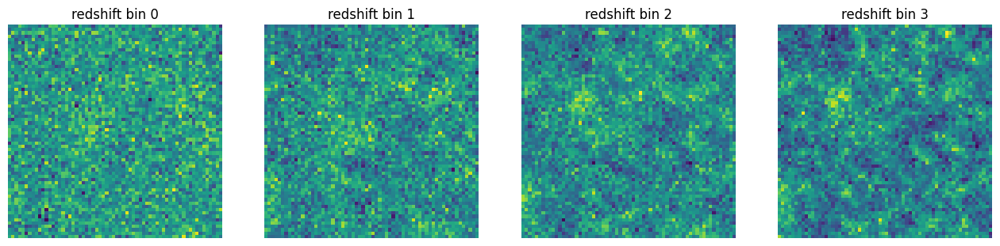

In [ ]:
# plotting the trace
from scipy.ndimage import gaussian_filter

figure(figsize=[16,4])
for i in range(4):
    subplot(1,4,i+1)
    title('redshift bin %d'%i)
    imshow(gaussian_filter(model_trace['kappa_%d'%i]['value'],0.))
    axis('off')

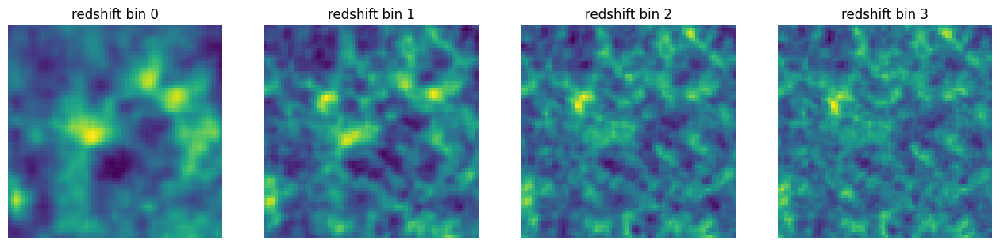

In [ ]:
# plotting the trace
figure(figsize=[16,4])
for i in range(4):
    subplot(1,4,i+1)
    title('redshift bin %d'%i)
    imshow(model_trace['kappa_%d'%i]['fn'].mean)
    axis('off')

## Full Field Inference

Now we do the same thing, but by sampling over the simulator

In [ ]:
from functools import partial

In [ ]:
# Let's condition the model on the observed maps
observed_model = condition(model, {'kappa_0': model_trace['kappa_0']['value'],
                                   'kappa_1': model_trace['kappa_1']['value'],
                                   'kappa_2': model_trace['kappa_2']['value'],
                                   'kappa_3': model_trace['kappa_3']['value']
                                   })

In [ ]:
# Building the sampling kernel
nuts_kernel = numpyro.infer.NUTS(
    model=observed_model,
    init_strategy=partial(numpyro.infer.init_to_value, values={'omega_c': cosmo.Omega_c,
                                                               'sigma8': cosmo.sigma8,
                                                               'initial_conditions': model_trace['initial_conditions']['value']}),
    max_tree_depth=3,
    step_size=0.05)

In [ ]:
mcmc = numpyro.infer.MCMC(
       nuts_kernel,
       num_warmup=0,
       num_samples=10000,
       num_chains=5,
       chain_method='vectorized',
       thinning=10,
       progress_bar=True
    )

In [ ]:
mcmc.run(jax.random.PRNGKey(0))

sample: 100%|██████████| 10000/10000 [2:18:41<00:00,  1.20it/s]


In [ ]:
res = mcmc.get_samples()

In [ ]:
import pickle

with open('porqueres_model_hmc_chain.pickle', 'wb') as handle:
    pickle.dump(res, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# Also export just the cosmology chain in numpy format
np.savez('porqueres_model_hmc_chain.npz',
         omega_c=res['Omega_c'],
         sigma8=res['sigma8'])

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp porqueres_model_hmc_chain.pickle drive/MyDrive/

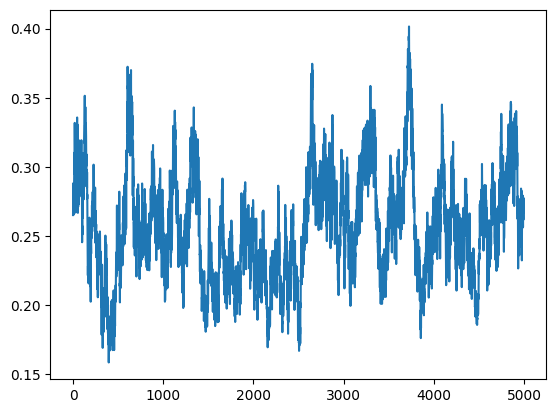

In [ ]:
plot(res['Omega_c'])

(0.38, 1.25)

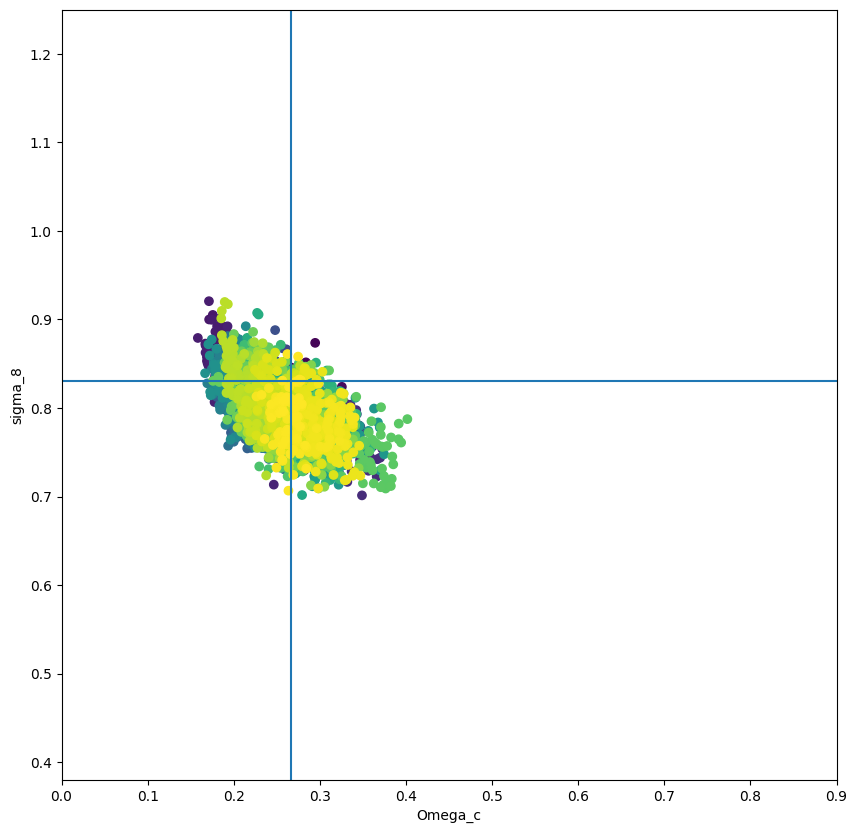

In [ ]:
figure(figsize=[10,10])
scatter(res['Omega_c'],
        res['sigma8'],
        c=arange(len(res['sigma8'])))
axvline(0.2664)
axhline(0.831)
xlabel('Omega_c')
ylabel('sigma_8')
xlim(0,0.9)
ylim(0.38,1.25)

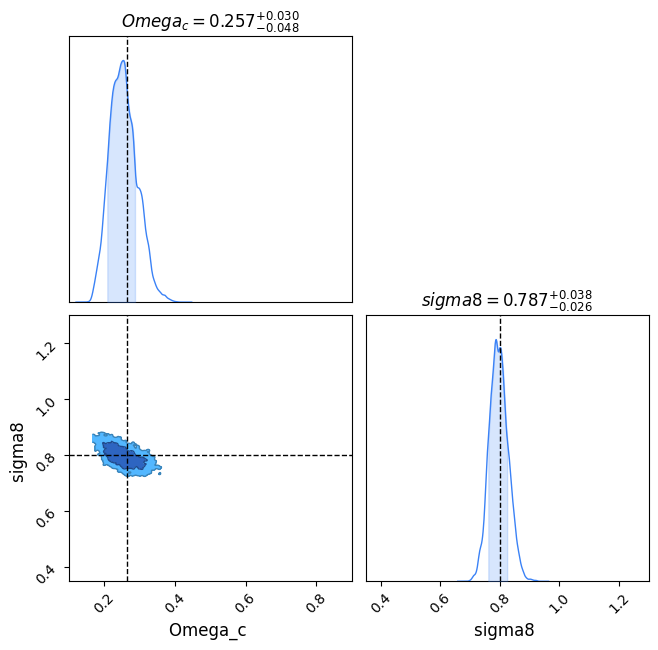

In [ ]:
import pandas as pd
from chainconsumer import Chain, ChainConsumer, PlotConfig, Truth

df = pd.DataFrame({k: np.array(res[k]) for k in ['Omega_c', 'sigma8']})

c = ChainConsumer()
c.add_chain(Chain(samples=df, name='LPT'))
c.add_truth(Truth(location={"Omega_c":cosmo.Omega_c, "sigma8":cosmo.sigma8}))
c.set_plot_config(PlotConfig( extents={"Omega_c": (0.1,0.9), "sigma8": (0.35,1.3)}))
fig = c.plotter.plot(figsize="column")

In [ ]:
# Making an animation of the lensing field and density field
recs = []
lc = []
for i in range(len(res['Omega_c'])//10):
    c = jc.Planck15(Omega_c=res['Omega_c'][i*10], Omega_b=0.049,
                    h=0.677, n_s=0.96, sigma8=res['sigma8'][i*10], w0=-1)
    kappa, lightcone = lensing_model(c, nz_shear, res['initial_conditions'][i*10])
    yo = lightcone.reshape([64, 64, 32, 128//32])[:,:,:16:2].mean(axis=-1)
    recs.append(kappa)
    lc.append(yo.T.reshape(8*64, 64).T)

In [ ]:
len(lc)

500

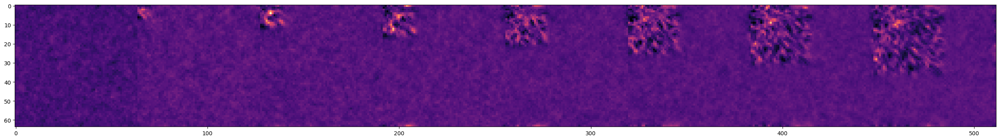

In [ ]:
fig, ax = subplots(figsize=(8*4,4))
imshow(np.stack(lc).mean(axis=0), cmap='magma')

In [ ]:
# The following is borrowed from https://github.com/ericjang/nf-jax/blob/master/nf-tutorial-jax.ipynb
from matplotlib import animation, rc

# from IPython.display import HTML, Image
# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')

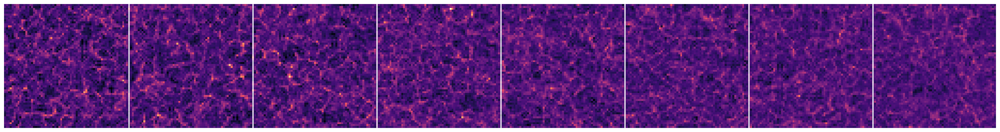

In [ ]:
# First set up the figure, the axis, and the plot element we want to animate
fig, ax = subplots(figsize=(8*4,4))

paths = ax.imshow(lc[0], cmap='magma')
for i in range(7):
    ax.axvline(64*(i+1), color='w', lw=2)

axis('off');

In [ ]:
def animate(inds):
  paths.set_data(lc[5*inds])
  return (paths,)

In [ ]:
anim = animation.FuncAnimation(fig, animate, frames=100, interval=100, blit=False, )

In [ ]:
anim

## Inference from the 2pt function of the field

To compare our full-field inference results, we are going to use SBI on the
power spectrum generated by the same forward model. This ensures that the model
is consistent between full-field and 2pt, the only difference being whether the
full field or power spectra observables.

In [96]:
observed_map = jnp.stack([model_trace['kappa_0']['value'],
                          model_trace['kappa_1']['value'],
                          model_trace['kappa_2']['value'],
                          model_trace['kappa_3']['value']], axis=-1)

In [98]:
# Adding code to draw many maps
from tqdm import tqdm

seeded_model = numpyro.handlers.seed(model, jax.random.PRNGKey(42))

params = []
maps = []
for i in tqdm(range(200_000)):
    model_trace = numpyro.handlers.trace(seeded_model).get_trace()
    kmap = np.stack([model_trace['kappa_0']['value'],
                      model_trace['kappa_1']['value'],
                      model_trace['kappa_2']['value'],
                      model_trace['kappa_3']['value']], axis=-1).astype('float32')
    params.append(np.stack([model_trace['Omega_c']['value'], model_trace['sigma8']['value']]).astype('float32'))
    maps.append(kmap)
    del model_trace

params = np.stack(params)
maps = np.stack(maps)

100%|██████████| 200000/200000 [59:07<00:00, 56.38it/s]


In [99]:
params = np.stack(params)
maps = np.stack(maps)

In [100]:
# saving
np.savez('porqueres_model_radom.npz',
         params=params,
         maps=maps)

In [101]:
!cp porqueres_model_radom.npz drive/MyDrive/porqueres_model_random.npz

In [102]:
# Now, let's compute the power spectra for these maps
import itertools

import astropy.units as u
from lenstools import ConvergenceMap

l_edges_kmap= np.linspace(50, 1000, 10)
lis=[0,1,2,3]
p_cross_sample=[]
N_sample = len(maps)
for k in range(N_sample):
    m_data=maps[k].T
    p_cross=[]
    for i, j in itertools.combinations(lis, 2):
        pi=ConvergenceMap(m_data[i], angle=field_size*u.deg).cross(ConvergenceMap(m_data[j], angle=field_size*u.deg),l_edges=l_edges_kmap)[1]
        p_cross.append(pi)
    p_cross_sample.append(p_cross)
ell_sample=ConvergenceMap(m_data[0], angle=field_size*u.deg).cross(ConvergenceMap(m_data[0], angle=field_size*u.deg),l_edges=l_edges_kmap)[0]

p_auto_sample=[]
for k in range(N_sample):
    m_data=maps[k].T
    p_auto=[]
    for i in range(4):
        pi=ConvergenceMap(m_data[i], angle=field_size*u.deg).powerSpectrum(l_edges_kmap)[1]
        p_auto.append(pi)
    p_auto_sample.append(p_auto)

/usr/local/lib/python3.10/dist-packages/lenstools/utils/mpi.py:15: UserWarning: Could not import mpi4py! (if you set sys.modules['mpi4py']=None please disregard this message)
  warnings.warn(wmsg)


In [103]:
spectra = np.concatenate([np.array(p_cross_sample), np.array(p_auto_sample)], axis=1).reshape([N_sample, -1])
# Normalizing spectra
mu, sigma = spectra.mean(axis=0), spectra.std(axis=0)
spectra_normed = (spectra - mu) / sigma

In [104]:
# And computing the spectrum of the observed map
m_data=observed_map.T
p_cross=[]
for i, j in itertools.combinations(lis, 2):
    pi=ConvergenceMap(m_data[i], angle=field_size*u.deg).cross(ConvergenceMap(m_data[j], angle=field_size*u.deg),l_edges=l_edges_kmap)[1]
    p_cross.append(pi)

p_auto=[]
for i in range(4):
    pi=ConvergenceMap(m_data[i], angle=field_size*u.deg).powerSpectrum(l_edges_kmap)[1]
    p_auto.append(pi)

true_spectra = np.concatenate([np.array(p_cross), np.array(p_auto)], axis=0).reshape([-1])
true_spectra_normed = (true_spectra - mu) / sigma

In [180]:
# Alright, cool, let's get some posteriors
import torch
from sbi import utils as utils
from sbi.inference import SNPE_A

In [183]:
prior = utils.BoxUniform(low=torch.tensor([0.1, 0.5]), high=torch.tensor([0.7, 1.6]))
inference = SNPE_A(prior=prior)
inference = inference.append_simulations(torch.tensor(params[:,:2].astype('float32')),
                                         torch.tensor(spectra_normed[:].astype('float32')))
# Train the density estimator
density_estimator = inference.train()
posterior = inference.build_posterior(density_estimator)
posterior_samples = posterior.sample((50000,), x=np.array(true_spectra_normed).squeeze())

 Neural network successfully converged after 65 epochs.

Drawing 50000 posterior samples:   0%|          | 0/50000 [00:00<?, ?it/s]

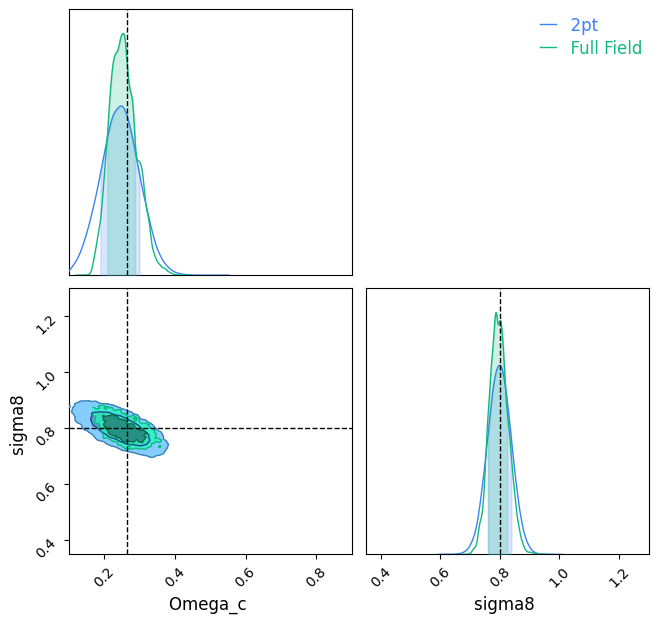

In [189]:
s = posterior_samples.cpu().detach().numpy()
df2 = pd.DataFrame({'Omega_c': s[:,0], 'sigma8': s[:,1]})

c = ChainConsumer()
c.add_chain(Chain(samples=df2, name='2pt'))
c.add_chain(Chain(samples=df, name='Full Field'))
c.add_truth(Truth(location={"Omega_c":cosmo.Omega_c, "sigma8":cosmo.sigma8}))
c.set_plot_config(PlotConfig( extents={"Omega_c": (0.1,0.9), "sigma8": (0.35,1.3)}))
fig = c.plotter.plot(figsize="column")